<a href="https://colab.research.google.com/github/ASowmya91/my-project1/blob/master/wound_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -qr yolov5/requirements.txt  # install dependencies (ignore errors)
%cd yolov5

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.6.0+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


In [ ]:
%cd /content

/content


In [ ]:
!curl -L "https://app.roboflow.com/ds/Mq6KF9GciA?key=1wJL4qwz7z" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1188      0 --:--:-- --:--:-- --:--:--  1186
100 2334k  100 2334k    0     0  1953k      0  0:00:01  0:00:01 --:--:--  268M
Archive:  roboflow.zip
 extracting: test/images/FLIR1702_jpg.rf.3db8da9d460ed299d0ccff314cfbbc87.jpg  
 extracting: test/images/FLIR1751_jpg.rf.ae3044bc3bf9a59739aca51a9a6e3700.jpg  
 extracting: train/images/FLIR1434-LAPTOP-TE13EAHV_jpg.rf.08be0588ab675012bfa552e90970184b.jpg  
 extracting: test/images/FLIR1662_jpg.rf.2d89c3d007eb42b197325b3118982bde.jpg  
 extracting: test/images/FLIR1292_jpg.rf.734b22edb9865a124679ebd8753c5805.jpg  
 extracting: train/images/FLIR1306_jpg.rf.07f0efb6007a3b705ff120e879e352d3.jpg  
 extracting: train/images/FLIR1430-LAPTOP-TE13EAHV_jpg.rf.0e7496e7591d605008d2562e1eae6488.jpg  
 extracting: train/images/FLIR1622_jpg.rf.0e2377c687d9cab536bbfb73

In [ ]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 9
names: ['frame_scale', 'normal_pin_site', 'normal_skin', 'pin', 'reddish_pin_site', 'steel_frame', 'temperature', 'wound', 'yellowish_pin_site']

In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))


In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 1000 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

Streaming output truncated to the last 5000 lines.
     1/999     1.42G    0.1066     0.159   0.06234    0.3279       189       416: 100% 5/5 [00:00<00:00,  5.47it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 2/2 [00:00<00:00, 12.45it/s]
                 all          23         118           0           0    6.44e-05    1.07e-05

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
     2/999     1.42G    0.1028    0.1537   0.06172    0.3182       185       416: 100% 5/5 [00:00<00:00,  6.56it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 2/2 [00:00<00:00, 11.50it/s]
                 all          23         118           0           0    6.05e-05    1.15e-05

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
     3/999     1.42G   0.09982    0.1495   0.06136    0.3107       118       416: 100% 5/5 [00:00<00:00,  6.77i

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

exp0_yolov5s_results/


In [ ]:
%ls runs/exp0_yolov5s_results/weights

best.pt  last.pt


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/exp0_yolov5s_results/weights/best.pt --img 1024 --conf 0.1 --source ../valid/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', img_size=1024, iou_thres=0.45, output='inference/output', save_txt=False, source='../valid/images', update=False, view_img=False, weights=['runs/exp0_yolov5s_results/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 140 layers, 7.26809e+06 parameters, 0 gradients
image 1/23 /content/valid/images/FLIR0242_jpg.rf.a740c7aaf1a02e37a3b362b57ab6569d.jpg: 1024x1024 1 normal_pin_sites, 10 normal_skins, 2 pins, 2 reddish_pin_sites, 1 steel_frames, 1 yellowish_pin_sites, Done. (0.020s)
image 2/23 /content/valid/images/FLIR0268_jpg.rf.8cdc01b78016ceb30a54648c08e80da3.jpg: 1024x1024 5 normal_pin_sites, 6 normal_skins, 6 pins, 4 reddish_pin_sites, 3 steel_frames, 1 wounds, 4 yellowish_pin_sites, Done. (0.019s)
image 3/23 /content/valid/images/FLIR0277_jpg.rf.a3d803fcd8a896a89699c4d83876e0bf.jpg: 1024x1024 4 normal_sk

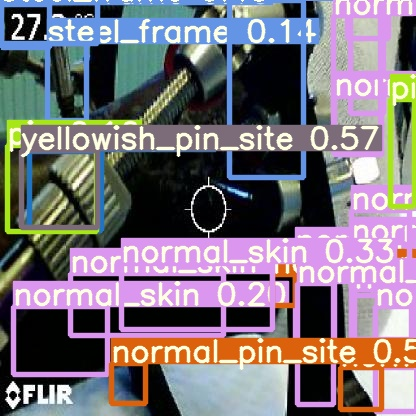

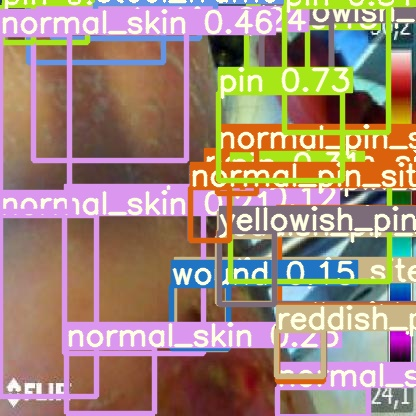

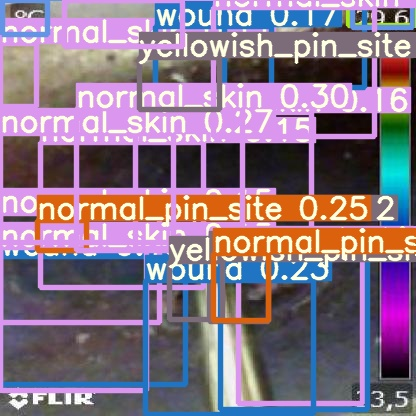

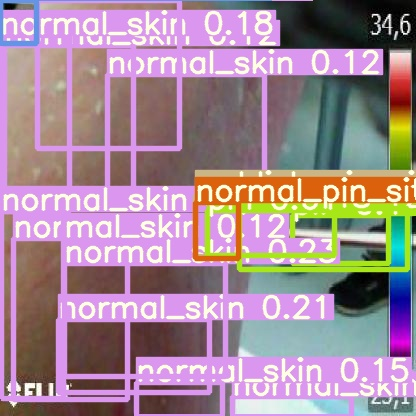

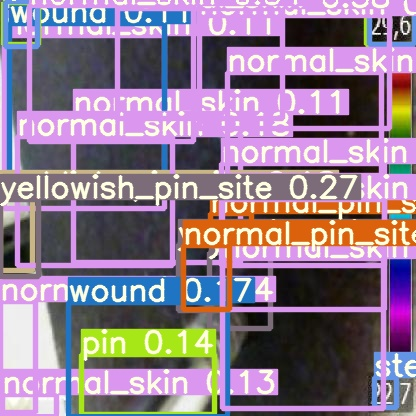

...

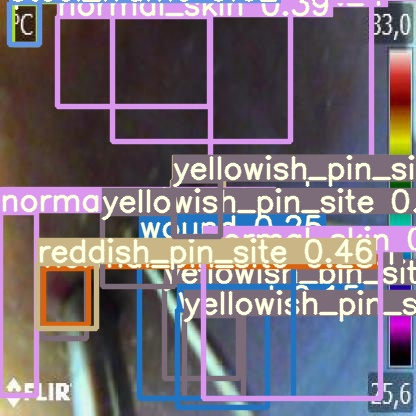

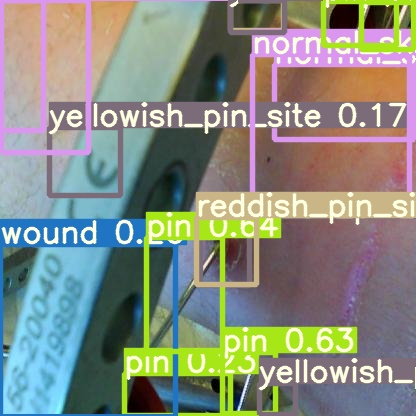

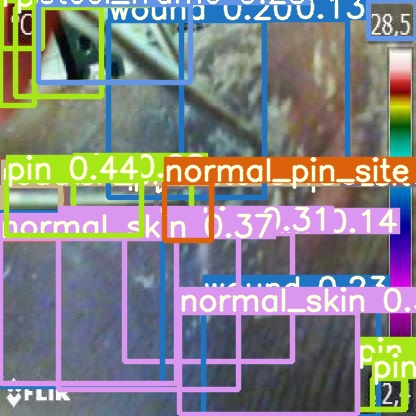

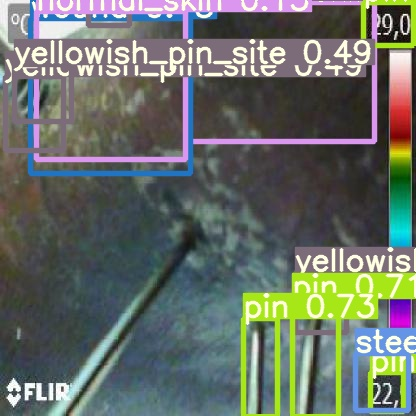

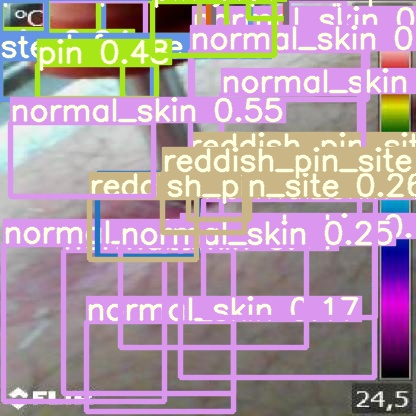

In [ ]:
#@title Default title text
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/exp0_yolov5s_results/weights/best.pt --img 900 --conf 0.3 --source ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.3, device='', img_size=900, iou_thres=0.45, output='inference/output', save_txt=False, source='../test/images', update=False, view_img=False, weights=['runs/exp0_yolov5s_results/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 140 layers, 7.26809e+06 parameters, 0 gradients
image 1/12 /content/test/images/FLIR0254_jpg.rf.fc3676375eabedd403cbe984e3f96748.jpg: 928x928 1 pins, 2 reddish_pin_sites, 1 steel_frames, 1 yellowish_pin_sites, Done. (0.018s)
image 2/12 /content/test/images/FLIR0402_jpg.rf.c1f89d5ac08ad65e1f81e8dc6d6e221c.jpg: 928x928 1 normal_pin_sites, 2 pins, 1 wounds, 5 yellowish_pin_sites, Done. (0.018s)
image 3/12 /content/test/images/FLIR0426_jpg.rf.2c50fbd546e213f2236e0b99ba6cf5f8.jpg: 928x928 1 normal_pin_sites, 2 normal_skins, 3 pins, 2 steel_frames, 1 wounds, 2 yellowish_pin_sites, Done. (0.018s)
imag

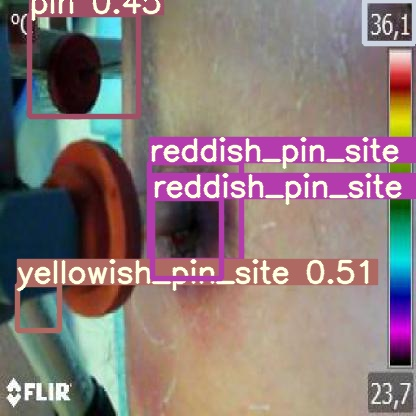

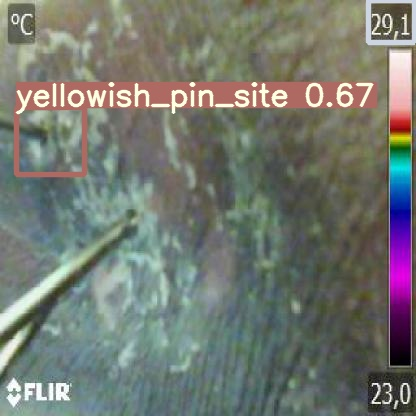

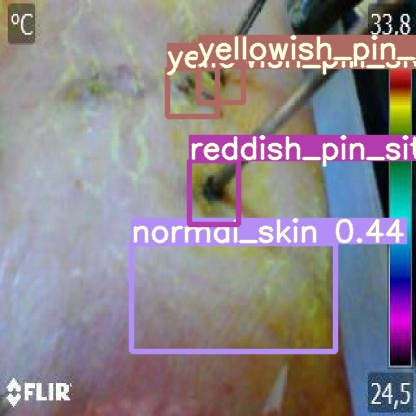

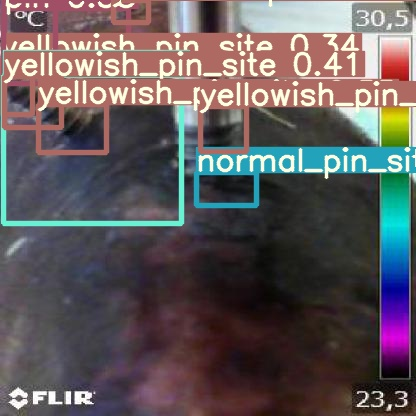

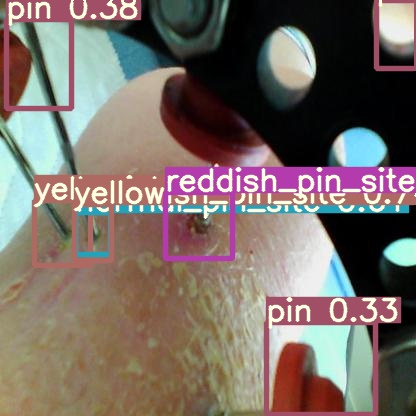

...

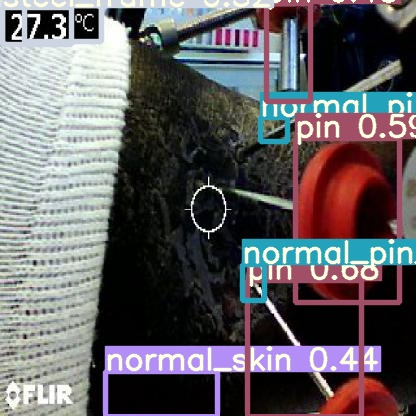

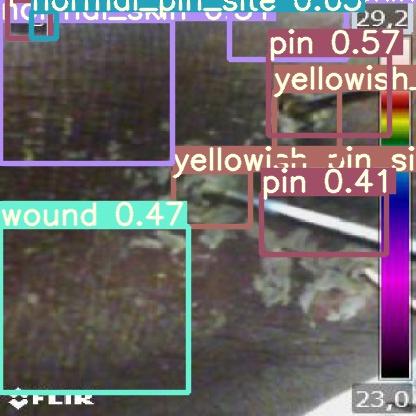

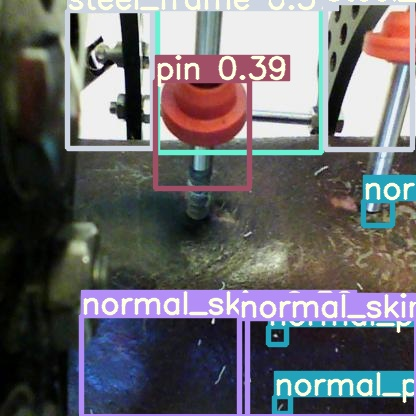

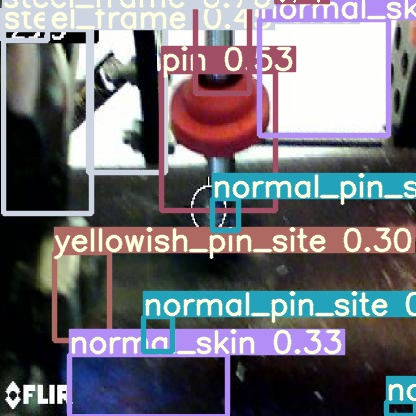

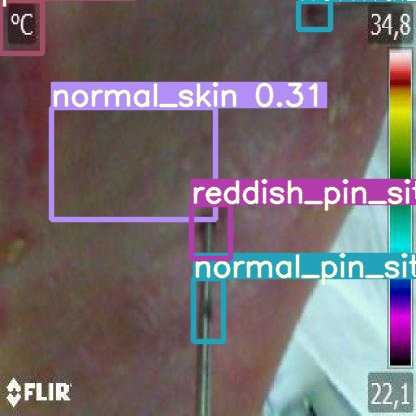

In [ ]:
#@title Default title text
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/exp0_yolov5s_results/weights/best.pt --img 1024 --conf 0.3 --source /content/FLIR0254.jpg

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.3, device='', img_size=1024, iou_thres=0.45, output='inference/output', save_txt=False, source='/content/FLIR0254.jpg', update=False, view_img=False, weights=['runs/exp0_yolov5s_results/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 140 layers, 7.26809e+06 parameters, 0 gradients
Traceback (most recent call last):
  File "detect.py", line 170, in <module>
    detect()
  File "detect.py", line 54, in detect
    dataset = LoadImages(source, img_size=imgsz)
  File "/content/yolov5/utils/datasets.py", line 120, in __init__
    raise Exception('ERROR: %s does not exist' % p)
Exception: ERROR: /content/FLIR0254.jpg does not exist


In [ ]:
#@title Default title text
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    display(Image('/content/FLIR0254.jpg'))
    #print("\n")

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/exp0_yolov5s_results/weights/best.pt /content/gdrive/My\ Drive

Mounted at /content/drive
